In [1]:
import os
import sys
import math
import argparse
import numpy as np
import pandas as pd
from collections import defaultdict, Counter
from sklearn.decomposition import PCA
from typing import Dict, List, Tuple, Iterable, Union, Optional, Set, Sequence, Callable, DefaultDict, Any

# Keras imports
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import LeakyReLU, PReLU, ELU, ThresholdedReLU, Lambda, Reshape, LayerNormalization
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, Callback
from tensorflow.keras.layers import SpatialDropout1D, SpatialDropout2D, SpatialDropout3D, add, concatenate
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization, Activation, Flatten, LSTM, RepeatVector
from tensorflow.keras.layers import Conv1D, Conv2D, Conv3D, UpSampling1D, UpSampling2D, UpSampling3D, MaxPooling1D
from tensorflow.keras.layers import MaxPooling2D, MaxPooling3D, AveragePooling1D, AveragePooling2D, AveragePooling3D, Layer
from tensorflow.keras.layers import SeparableConv1D, SeparableConv2D, DepthwiseConv2D, Concatenate, Add
from tensorflow.keras.layers import GlobalAveragePooling1D, GlobalAveragePooling2D, GlobalAveragePooling3D


# ML4CVD Imports
from ml4h.TensorMap import TensorMap
from ml4h.arguments import parse_args
from ml4h.models import make_multimodal_multitask_model, train_model_from_generators, make_hidden_layer_model, _conv_layer_from_kind_and_dimension
from ml4h.tensor_generators import TensorGenerator, big_batch_from_minibatch_generator, test_train_valid_tensor_generators
from ml4h.recipes import plot_predictions, infer_hidden_layer_multimodal_multitask

# IPython imports
%matplotlib inline
import matplotlib.pyplot as plt


Tensor = tf.Tensor

ACTIVATION_CLASSES = {
    'leaky': LeakyReLU(),
    'prelu': PReLU(),
    'elu': ELU(),
    'thresh_relu': ThresholdedReLU,
}
ACTIVATION_FUNCTIONS = {
    'swish': tf.nn.swish,
    'gelu': tfa.activations.gelu,
    'lisht': tfa.activations.lisht,
    'mish': tfa.activations.mish,
}
NORMALIZATION_CLASSES = {
    'batch_norm': BatchNormalization,
    'layer_norm': LayerNormalization,
    'instance_norm': tfa.layers.InstanceNormalization,
    'poincare_norm': tfa.layers.PoincareNormalize,
}
CONV_REGULARIZATION_CLASSES = {
    # class name -> (dimension -> class)
    'spatial_dropout': {2: SpatialDropout1D, 3: SpatialDropout2D, 4: SpatialDropout3D},
    'dropout': defaultdict(lambda _: Dropout),
}
DENSE_REGULARIZATION_CLASSES = {
    'dropout': Dropout,  # TODO: add l1, l2
}

InternalError: CUDA runtime implicit initialization on GPU:0 failed. Status: out of memory

In [6]:
sys.argv = ['train', 
            '--tensors', '/mnt/disks/segmented-sax-lax/2020-07-07/', 
            '--input_tensors', 'lax_4ch_diastole_slice0_256_3d', 
            '--output_tensors', 'lax_4ch_diastole_slice0_256_3d',
            '--batch_size', '2',
            '--epochs', '2',
            '--learning_rate', '0.001',
            '--training_steps', '128',
            '--validation_steps', '10',
            '--test_steps', '1',
            '--num_workers', '0',
            '--tensormap_prefix', 'ml4h.tensormap.ukb.mri',
            '--model_file', './recipes_output/lax_4ch_diastole_256_autoencoder_pool2_3layer_leaky/lax_4ch_diastole_256_autoencoder_pool2_3layer_leaky.h5',
            '--id', 'lax_4ch_diastole_slice0_256_3d']
args = parse_args()
model = make_multimodal_multitask_model(**args.__dict__)
generate_train, generate_valid, generate_test = test_train_valid_tensor_generators(**args.__dict__)
test_data, test_labels, test_paths = big_batch_from_minibatch_generator(generate_test, args.test_steps)

2020-09-11 10:07:52,175 - logger:25 - INFO - Logging configuration was loaded. Log messages can be found at ./recipes_output/lax_4ch_diastole_slice0_256_3d/log_2020-09-11_10-07_0.log.
2020-09-11 10:07:52,177 - arguments:441 - INFO - Command Line was: 
./scripts/tf.sh train --tensors /mnt/disks/segmented-sax-lax/2020-07-07/ --input_tensors lax_4ch_diastole_slice0_256_3d --output_tensors lax_4ch_diastole_slice0_256_3d --batch_size 2 --epochs 2 --learning_rate 0.001 --training_steps 128 --validation_steps 10 --test_steps 1 --num_workers 0 --tensormap_prefix ml4h.tensormap.ukb.mri --model_file ./recipes_output/lax_4ch_diastole_256_autoencoder_pool2_3layer_leaky/lax_4ch_diastole_256_autoencoder_pool2_3layer_leaky.h5 --id lax_4ch_diastole_slice0_256_3d

2020-09-11 10:07:52,178 - arguments:442 - INFO - Arguments are Namespace(activation='relu', aligned_dimension=16, alpha=0.5, anneal_max=2.0, anneal_rate=0.0, anneal_shift=0.0, app_csv=None, b_slice_force=None, balance_csvs=[], batch_size=2, b

2020-09-11 10:07:54,991 - tensor_generators:661 - INFO - Found 31871 train, 9242 validation, and 4569 testing tensors at: /mnt/disks/segmented-sax-lax/2020-07-07/
2020-09-11 10:07:55,015 - tensor_generators:151 - INFO - Started 1 test workers with cache size 0.0GB.
2020-09-11 10:07:55,077 - tensor_generators:504 - INFO - Made a big batch of tensors with key:input_lax_4ch_diastole_slice0_256_3d_continuous and shape:(2, 192, 256, 1).
2020-09-11 10:07:55,078 - tensor_generators:504 - INFO - Made a big batch of tensors with key:output_lax_4ch_diastole_slice0_256_3d_continuous and shape:(2, 192, 256, 1).


In [3]:
def plot_ae_towards_attractor(model, matrix, samples=6, steps = 30):
    sample_every = steps//samples
    fig, axes = plt.subplots(1, samples, figsize=(samples*16,16))
    col = 0
    for i in range(steps):
        if i % sample_every == 0 and col < samples:
            axes[col].imshow(matrix[0, :, :, 0], cmap = 'gray')
            axes[col].set_yticks(())
            col += 1
        matrix = model.predict(matrix)   
    return matrix

### Reconstructions from ConvNet are smooth, capture main cardiac chambers, but lose fine details

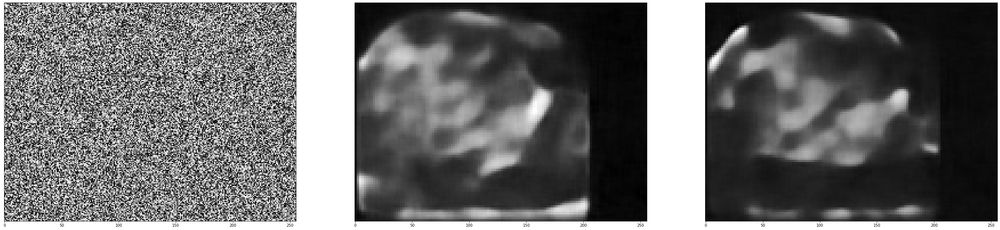

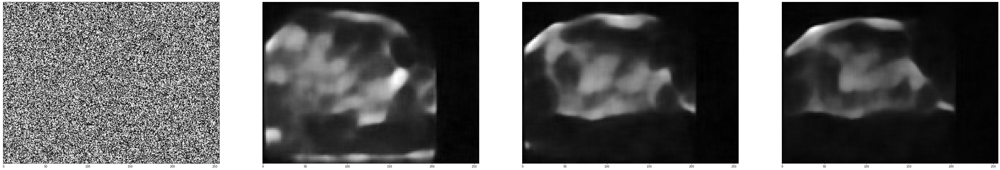

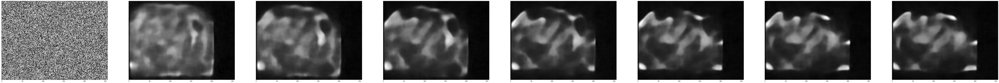

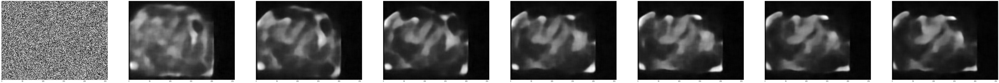

In [4]:
m = plot_ae_towards_attractor(model,  np.random.uniform(-1, 1, (1,192,256,1)), samples = 3, steps=18)
m = plot_ae_towards_attractor(model,  np.random.uniform(-1, 1, (1,192,256,1)), samples = 4, steps=28)
m = plot_ae_towards_attractor(model,  np.random.random((1,192,256,1)), samples=8, steps = 16)
m = plot_ae_towards_attractor(model,  np.random.random((1,192,256,1)), samples=8, steps = 24)

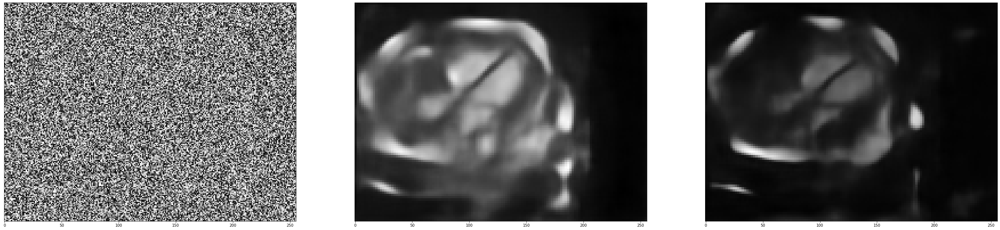

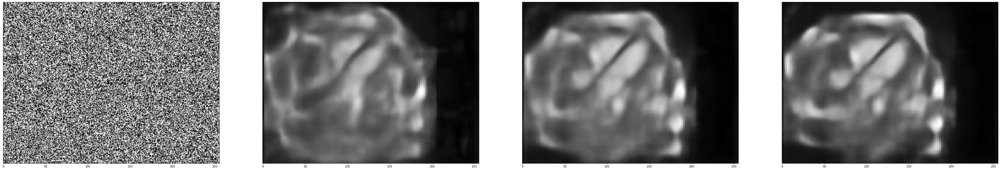

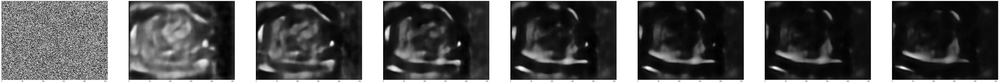

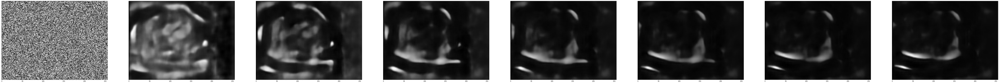

In [7]:
m = plot_ae_towards_attractor(model,  np.random.uniform(-1, 1, (1,192,256,1)), samples = 3, steps=12)
m = plot_ae_towards_attractor(model,  np.random.uniform(-1, 1, (1,192,256,1)), samples = 4, steps=4)
m = plot_ae_towards_attractor(model,  np.random.random((1,192,256,1)), samples=8, steps = 16)
m = plot_ae_towards_attractor(model,  np.random.random((1,192,256,1)), samples=8, steps = 24)

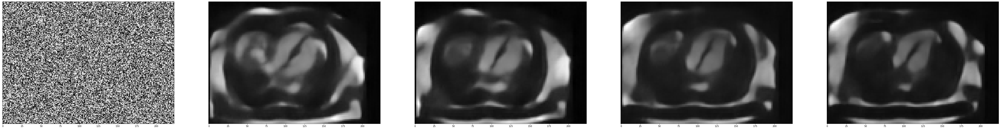

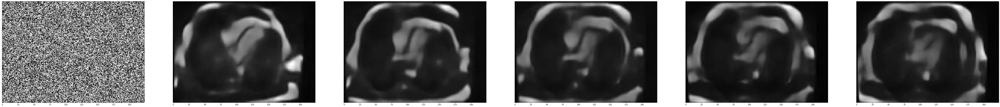

In [6]:
m = plot_ae_towards_attractor(model,  np.random.random((1,160,224,1)), samples=5, steps = 50)
m = plot_ae_towards_attractor(model,  np.random.uniform(-1, 1, (1,160,224,1)), steps=100)

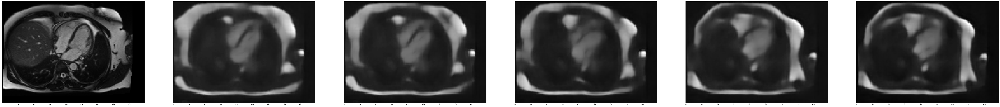

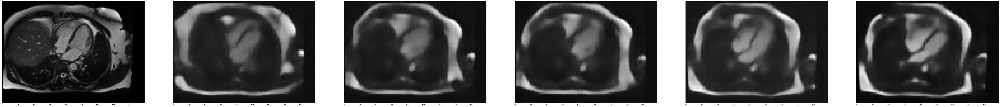

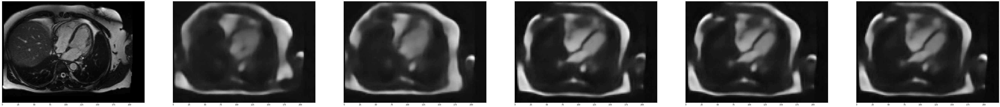

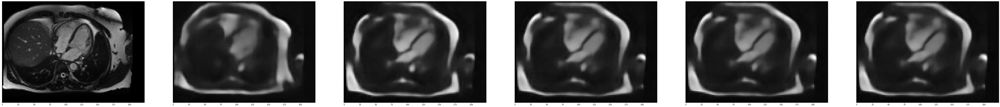

In [19]:
m = plot_ae_towards_attractor(model,  test_data['input_lax_4ch_diastole_slice0_224_3d_continuous'], steps=160)
m = plot_ae_towards_attractor(model,  test_data['input_lax_4ch_diastole_slice0_224_3d_continuous'], steps=320)
m = plot_ae_towards_attractor(model,  test_data['input_lax_4ch_diastole_slice0_224_3d_continuous'], steps=540)
m = plot_ae_towards_attractor(model,  test_data['input_lax_4ch_diastole_slice0_224_3d_continuous'], steps=860)

In [7]:
def pca_on_matrix(matrix, pca_components):
    pca = PCA()
    pca.fit(matrix)
    print(f'PCA explains {100*np.sum(pca.explained_variance_ratio_[:pca_components]):0.1f}% of variance with {pca_components} top PCA components.')
    matrix_reduced = pca.transform(matrix)[:, :pca_components]
    print(f'PCA reduces matrix shape:{matrix_reduced.shape} from matrix shape: {matrix.shape}')
    plot_scree(pca_components, 100*pca.explained_variance_ratio_)
    return pca, matrix_reduced

def plot_scree(pca_components, percent_explained):
    _ = plt.figure(figsize=(6, 4))
    plt.plot(range(len(percent_explained)), percent_explained, 'g.-', linewidth=1)
    plt.axvline(x=pca_components, c='r', linewidth=3)
    label = f'{np.sum(percent_explained[:pca_components]):0.1f}% of variance explained by top {pca_components} of {len(percent_explained)} components'
    plt.text(pca_components+0.02*len(percent_explained), percent_explained[1], label)
    plt.title('Scree Plot')
    plt.xlabel('Principal Components')
    plt.ylabel('% of Variance Explained by Each Component')
    figure_path = f'./results/pca_{pca_components}_of_{len(percent_explained)}_testimonials.png'
    if not os.path.exists(os.path.dirname(figure_path)):
        os.makedirs(os.path.dirname(figure_path))
    plt.savefig(figure_path)
    
def unit_vector(vector):
    """ Returns the unit vector of the vector.  """
    return vector / np.linalg.norm(vector)

def angle_between(v1, v2):
    """ Returns the angle in radians between vectors 'v1' and 'v2'::

            >>> angle_between((1, 0, 0), (0, 1, 0))
            1.5707963267948966
            >>> angle_between((1, 0, 0), (1, 0, 0))
            0.0
            >>> angle_between((1, 0, 0), (-1, 0, 0))
            3.141592653589793
    """
    v1_u = unit_vector(v1)
    v2_u = unit_vector(v2)
    return np.arccos(np.clip(np.dot(v1_u, v2_u), -1.0, 1.0)) * 180 / 3.141592

def directions_in_latent_space(stratify_column, stratify_thresh, split_column, split_thresh, latent_cols, latent_df):
    hit = latent_df.loc[latent_df[stratify_column] >= stratify_thresh][latent_cols].to_numpy()
    miss = latent_df.loc[latent_df[stratify_column] < stratify_thresh][latent_cols].to_numpy()
    miss_mean_vector = np.mean(miss, axis=0)
    hit_mean_vector = np.mean(hit, axis=0)
    strat_vector = hit_mean_vector - miss_mean_vector
    
    hit1 = latent_df.loc[(latent_df[stratify_column] >= stratify_thresh) 
                        & (latent_df[split_column] >= split_thresh)][latent_cols].to_numpy()
    miss1 = latent_df.loc[(latent_df[stratify_column] < stratify_thresh) 
                        & (latent_df[split_column] >= split_thresh)][latent_cols].to_numpy()
    hit2 = latent_df.loc[(latent_df[stratify_column] >= stratify_thresh) 
                        & (latent_df[split_column] < split_thresh)][latent_cols].to_numpy()
    miss2 = latent_df.loc[(latent_df[stratify_column] < stratify_thresh) 
                        & (latent_df[split_column] < split_thresh)][latent_cols].to_numpy()
    miss_mean_vector1 = np.mean(miss1, axis=0)
    hit_mean_vector1 = np.mean(hit1, axis=0)
    angle1 = angle_between(miss_mean_vector1, hit_mean_vector1)
    miss_mean_vector2 = np.mean(miss2, axis=0)
    hit_mean_vector2 = np.mean(hit2, axis=0)
    angle2 = angle_between(miss_mean_vector2, hit_mean_vector2)
    h1_vector = hit_mean_vector1-miss_mean_vector1
    h2_vector = hit_mean_vector2-miss_mean_vector2
    angle3 = angle_between(h1_vector, h2_vector)
    angle4 = angle_between(strat_vector, h1_vector)
    angle5 = angle_between(strat_vector, h2_vector)
    print(f'\n Between {stratify_column}, and splits: {split_column}\n',
          f'Angles h1 and m1: {angle1:.2f}, h2 and m2 {angle2:.2f} h1-m1 and h2-m2 {angle3:.2f} degrees.\n'
          f'stratify threshold: {stratify_thresh}, split thresh: {split_thresh}, \n'
          f'hit_mean_vector2 shape {miss_mean_vector1.shape}, miss1:{hit_mean_vector2.shape} \n'
          f'{stratify_column} >= {stratify_thresh} && {split_column} >= {split_thresh} Hit1 shape: {hit1.shape}\n' 
          f'{stratify_column} < {stratify_thresh} && {split_column} >= {split_thresh} Miss1 shape: {miss1.shape}\n'
          f'{stratify_column} >= {stratify_thresh} && {split_column} < {split_thresh}  Hit1 shape: {hit2.shape}\n'
          f'{stratify_column} < {stratify_thresh} && {split_column} < {split_thresh}  Miss2 shape: {miss2.shape}\n'
          )

def stratify_latent_space(stratify_column, stratify_thresh, latent_cols, latent_df):
    hit = latent_df.loc[latent_df[stratify_column] >= stratify_thresh][latent_cols].to_numpy()
    miss = latent_df.loc[latent_df[stratify_column] < stratify_thresh][latent_cols].to_numpy()
    miss_mean_vector = np.mean(miss, axis=0)
    hit_mean_vector = np.mean(hit, axis=0)
    angle = angle_between(miss_mean_vector, hit_mean_vector)
    print(f'Angle between {stratify_column} centroid and all others is: {angle:.1f} degrees.\n'
          f'Hit shape {hit.shape}, miss:{miss.shape} threshold:{stratify_thresh}\n'
          f'Distance: {np.linalg.norm(hit_mean_vector-miss_mean_vector):.3f}, Hit std {np.std(hit, axis=1).mean():.3f}, miss std:{np.std(miss, axis=1).mean():.3f}\n')
    
def plot_pcs(sides, color_key):
    f, axes = plt.subplots(sides, sides, figsize=(16, 16))
    for i, ax in enumerate(axes.ravel()):
        colors = latent_df[color_key].to_numpy()
        points = ax.scatter(matrix_reduce[:, i], matrix_reduce[:, i+1], c=colors)
        f.colorbar(points, ax=ax)
        



        


<class 'pandas.core.frame.DataFrame'>
Int64Index: 11368 entries, 0 to 11367
Columns: 561 entries, sample_id to latent_511
dtypes: float64(557), int64(2), object(2)
memory usage: 48.7+ MB
False    2697
True       14
Name: has_ttntv, dtype: int64


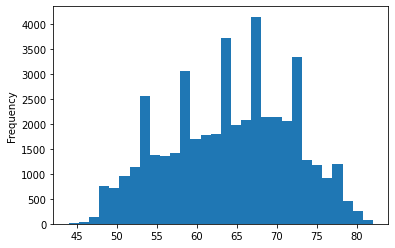

In [3]:
df = pd.read_csv('/home/sam/ml/trained_models/lax_4ch_diastole_autoencode_leaky_converge/tensors_all_union.csv')
df['21003_Age-when-attended-assessment-centre_2_0'].plot.hist(bins=30)
hidden_inference = './recipes_output/lax_4ch_diastole_autoencoder/hidden_inference_lax_4ch_diastole_autoencoder.tsv'
#hidden_inference = '/home/sam/ml/trained_models/lax_4ch_diastole_leaky_wide_autoencode2/hidden_inference_lax_4ch_diastole_leaky_wide_autoencode2.tsv'
#hidden_inference = './recipes_output/lax_4ch_diastole_autoencoder_converge/hidden_inference_lax_4ch_diastole_autoencoder_converge.tsv'
#hidden_inference = './recipes_output/lax_4ch_diastole_autoencoder_no_flat2/hidden_inference_lax_4ch_diastole_autoencoder_no_flat2.tsv'
#hidden_inference = '/home/sam/hidden_inference_no_flat2_3000.tsv'
#hidden_inference = './recipes_output/lax_4ch_diastole_autoencoder_16_12_pool2_392d/hidden_inference_lax_4ch_diastole_autoencoder_16_12_pool2_392d.tsv'
hidden_inference = './recipes_output/lax_4ch_diastole_256_autoencoder_pool2_3layer_leaky/hidden_inference_lax_4ch_diastole_256_autoencoder_pool2_3layer_leaky.tsv'
df2 = pd.read_csv(hidden_inference, sep='\t')
df['fpath'] = pd.to_numeric(df['fpath'], errors='coerce')
df2['sample_id'] = pd.to_numeric(df2['sample_id'], errors='coerce')
#df.info()
latent_df = pd.merge(df, df2, left_on='fpath', right_on='sample_id', how='inner')
#latent_df.info()
df3 = pd.read_csv('/home/sam/tsvs/ttn_disease.tsv', sep='\t')
df4 = pd.read_csv('/home/sam/csvs/has_exome.csv')
latent_df = pd.merge(df3, latent_df, left_on='sample_id', right_on='sample_id', how='right')
latent_df.info()
print(latent_df['has_ttntv'].value_counts())

In [4]:
latent_df.head()

,sample_id,has_ttntv,incident_composite_af_chf_dcm_death,composite_af_chf_dcm_death_free_survival,incident_af,af_free_survival,incident_dcm,dcm_free_survival,incident_chf,chf_free_survival,...,latent_502,latent_503,latent_504,latent_505,latent_506,latent_507,latent_508,latent_509,latent_510,latent_511
0,1000169,False,0.0,0.709056,0.0,0.709056,0.0,0.709056,0.0,0.709056,...,0.247999,-1.832840,-0.365394,-1.101748,0.939242,-1.095724,-0.801210,1.302311,-1.158494,-0.981397
1,1000571,False,0.0,0.678919,0.0,0.678919,0.0,0.678919,0.0,0.678919,...,0.686535,-0.443610,-0.700437,-5.015567,-0.022351,0.243119,-0.905351,0.759477,-1.157773,-1.390583
2,1000795,False,0.0,0.523896,0.0,0.523896,0.0,0.523896,0.0,0.523896,...,-0.167575,-1.698881,-1.070929,-0.029733,1.180223,-2.107762,1.882439,0.078243,-1.327052,-0.578165
3,1000800,False,0.0,2.693303,0.0,2.693303,0.0,2.693303,0.0,2.693303,...,0.223891,-3.363301,0.211871,-1.103250,1.304027,-2.420957,-2.358543,-1.161782,-0.707619,0.374195
4,1001047,False,0.0,1.562481,0.0,1.562481,0.0,1.562481,0.0,1.562481,...,-0.492398,-0.659718,-3.262888,-1.823830,0.315056,0.808006,-1.507050,-1.100842,-1.927302,0.050769


### Latent space of the Non-U-net CNN has clear alignments for basic phenotypes
- BMI, sex, left ventricle mass, afib and CAD diagnosis showed large differences in Radians.
- Sanity check: stratifying by sample ID does not show much alignment.

PCA explains 39.4% of variance with 10 top PCA components.
PCA reduces matrix shape:(11368, 10) from matrix shape: (11368, 512)
Angle between Sex_Female_0_0 centroid and all others is: 29.9 degrees.
Hit shape (5987, 512), miss:(5381, 512) threshold:1.0
Distance: 7.498, Hit std 1.173, miss std:1.153

Angle between has_ttntv centroid and all others is: 24.6 degrees.
Hit shape (14, 512), miss:(2697, 512) threshold:1.0
Distance: 7.109, Hit std 1.184, miss std:1.166

Angle between atrial_fibrillation_or_flutter centroid and all others is: 14.4 degrees.
Hit shape (452, 512), miss:(10916, 512) threshold:1.0
Distance: 3.509, Hit std 1.147, miss std:1.164

Angle between coronary_artery_disease centroid and all others is: 14.6 degrees.
Hit shape (413, 512), miss:(10955, 512) threshold:1.0
Distance: 3.565, Hit std 1.152, miss std:1.164

Angle between hypertension centroid and all others is: 12.2 degrees.
Hit shape (3593, 512), miss:(7775, 512) threshold:1.0
Distance: 3.011, Hit std 1.159, miss st

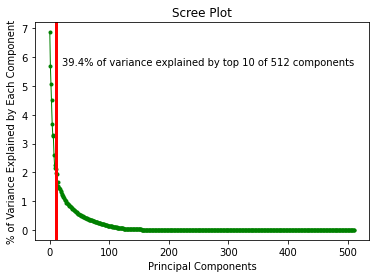

In [5]:
import matplotlib.pyplot as plt
latent_dimension = 512
latent_cols = [f'latent_{i}' for i in range(latent_dimension)]
pca, matrix_reduce = pca_on_matrix(df2[latent_cols].to_numpy(), 10)
for strat in ['Sex_Female_0_0', 'has_ttntv', 'atrial_fibrillation_or_flutter', 
              'coronary_artery_disease', 'hypertension']:
    stratify_latent_space(strat, 1.0, latent_cols, latent_df)
strats = ['LVEF', 'LVM', 'LVEDV', 'sample_id',
              '21001_Body-mass-index-BMI_0_0', '21003_Age-when-attended-assessment-centre_2_0']
theshes = [45, 100, 150, 1250000, 27.5, 70]
for strat, thresh in zip(strats, theshes):
    stratify_latent_space(strat, thresh, latent_cols, latent_df)

PCA explains 39.4% of variance with 10 top PCA components.
PCA reduces matrix shape:(11368, 10) from matrix shape: (11368, 512)

 Between Sex_Female_0_0, and splits: LVEF
 Angles h1 and m1: 31.37, h2 and m2 43.98 h1-m1 and h2-m2 34.10 degrees.
stratify threshold: 1.0, split thresh: 50, 
hit_mean_vector2 shape (512,), miss1:(512,) 
Sex_Female_0_0 >= 1.0 && LVEF >= 50 Hit1 shape: (506, 512)
Sex_Female_0_0 < 1.0 && LVEF >= 50 Miss1 shape: (438, 512)
Sex_Female_0_0 >= 1.0 && LVEF < 50  Hit1 shape: (11, 512)
Sex_Female_0_0 < 1.0 && LVEF < 50  Miss2 shape: (43, 512)


 Between Sex_Female_0_0, and splits: LVM
 Angles h1 and m1: 31.51, h2 and m2 30.25 h1-m1 and h2-m2 46.89 degrees.
stratify threshold: 1.0, split thresh: 100, 
hit_mean_vector2 shape (512,), miss1:(512,) 
Sex_Female_0_0 >= 1.0 && LVM >= 100 Hit1 shape: (23, 512)
Sex_Female_0_0 < 1.0 && LVM >= 100 Miss1 shape: (271, 512)
Sex_Female_0_0 >= 1.0 && LVM < 100  Hit1 shape: (497, 512)
Sex_Female_0_0 < 1.0 && LVM < 100  Miss2 shape: (21

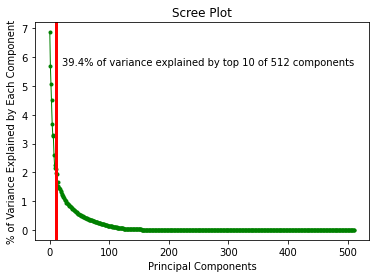

In [8]:
latent_dimension = 512
latent_cols = [f'latent_{i}' for i in range(latent_dimension)]
pca, matrix_reduce = pca_on_matrix(df2[latent_cols].to_numpy(), 10)
c_strats = [ 'Sex_Female_0_0']
for c_strat in c_strats:
    strats = ['LVEF', 'LVM', 'LVEDV', 'sample_id',
                  '21001_Body-mass-index-BMI_0_0', '21003_Age-when-attended-assessment-centre_2_0']
    theshes = [50, 100, 150, 1750000, 27.5, 70]
    for strat, thresh in zip(strats, theshes):
        directions_in_latent_space(c_strat, 1.0, strat, thresh, latent_cols, latent_df)

In [2]:
sys.argv = ['train', 
            '--tensors', '/mnt/disks/segmented-sax-lax/2020-07-07/', 
            '--input_tensors', 'lax_4ch_diastole_slice0_256_3d', 
            '--output_tensors', 'lax_4ch_diastole_slice0_256_3d',
            '--activation', 'relu',
            '--conv_layers', '48',
            '--dense_blocks', '48', '32', '24',
            '--conv_x', '3', 
            '--conv_y', '3',
            '--pool_x', '2',
            '--pool_y', '2',
            '--dense_layers', '512',
            '--batch_size', '1',
            '--epochs', '198',
            '--patience', '48',
            '--learning_rate', '0.00005',
            '--training_steps', '256',
            '--validation_steps', '32',
            '--valid_ratio', '0.2',
            '--test_steps', '2',
            '--num_workers', '0',
            '--inspect_model',
            #'--sample_csv', '/home/sam/sampleids_with_returned_lv_mass.csv',
            '--tensormap_prefix', 'ml4h.tensormap.ukb.mri',
            #'--model_layers', './recipes_output/lax_4ch_diastole_256_autoencoder_pool2_4layer_relu/lax_4ch_diastole_256_autoencoder_pool2_4layer_relu.h5',
            '--id', 'lax_4ch_diastole_256_autoencoder_pool2_3layer_squeeze_relu']
args = parse_args()
model = make_multimodal_multitask_model(**args.__dict__)
generate_train, generate_valid, generate_test = test_train_valid_tensor_generators(**args.__dict__)
model = train_model_from_generators(
        model, generate_train, generate_valid, args.training_steps, args.validation_steps, args.batch_size,
        args.epochs, args.patience, args.output_folder, args.id, args.inspect_model, args.inspect_show_labels,
)

NameError: name 'parse_args' is not defined

In [8]:
sys.argv = ['train', 
            '--tensors', '/mnt/disks/segmented-sax-lax/2020-07-07/',
            '--tensormap_prefix', 'ml4h.tensormap.ukb.mri',
            '--input_tensors', 'lax_4ch_diastole_slice0_256_3d', 
            '--output_tensors', 'lax_4ch_diastole_slice0_256_3d',
            '--conv_layers', '192', '64', '12',
            '--dense_layers',
            '--batch_size', '2',
            '--epochs', '192',
            '--patience', '32',
            '--learning_rate', '0.001',
            '--training_steps', '256',
            '--validation_steps', '30',
            '--test_steps', '2',
            '--num_workers', '0',
            '--model_file', './recipes_output/lax_4ch_diastole_256_autoencoder_pool2_3layer_leaky/lax_4ch_diastole_256_autoencoder_pool2_3layer_leaky.h5',
            '--id', 'lax_4ch_diastole_256_autoencoder_pool2_3layer_leaky']
args = parse_args()
plot_predictions(args)
infer_hidden_layer_multimodal_multitask(args)

2020-09-11 10:08:31,974 - logger:25 - INFO - Logging configuration was loaded. Log messages can be found at ./recipes_output/lax_4ch_diastole_256_autoencoder_pool2_3layer_leaky/log_2020-09-11_10-08_0.log.
2020-09-11 10:08:31,976 - arguments:441 - INFO - Command Line was: 
./scripts/tf.sh train --tensors /mnt/disks/segmented-sax-lax/2020-07-07/ --tensormap_prefix ml4h.tensormap.ukb.mri --input_tensors lax_4ch_diastole_slice0_256_3d --output_tensors lax_4ch_diastole_slice0_256_3d --conv_layers 192 64 12 --dense_layers --batch_size 2 --epochs 192 --patience 32 --learning_rate 0.001 --training_steps 256 --validation_steps 30 --test_steps 2 --num_workers 0 --model_file ./recipes_output/lax_4ch_diastole_256_autoencoder_pool2_3layer_leaky/lax_4ch_diastole_256_autoencoder_pool2_3layer_leaky.h5 --id lax_4ch_diastole_256_autoencoder_pool2_3layer_leaky

2020-09-11 10:08:31,977 - arguments:442 - INFO - Arguments are Namespace(activation='relu', aligned_dimension=16, alpha=0.5, anneal_max=2.0, anne

2020-09-11 10:08:34,715 - tensor_generators:151 - INFO - Started 1 test workers with cache size 0.0GB.
2020-09-11 10:08:34,838 - tensor_generators:504 - INFO - Made a big batch of tensors with key:input_lax_4ch_diastole_slice0_256_3d_continuous and shape:(4, 192, 256, 1).
2020-09-11 10:08:34,838 - tensor_generators:504 - INFO - Made a big batch of tensors with key:output_lax_4ch_diastole_slice0_256_3d_continuous and shape:(4, 192, 256, 1).
2020-09-11 10:08:35,485 - explorations:57 - INFO - Write predictions as PNGs TensorMap:lax_4ch_diastole_slice0_256_3d, y shape:(4, 192, 256, 1) labels:(4, 192, 256, 1) folder:./recipes_output/lax_4ch_diastole_256_autoencoder_pool2_3layer_leaky/prediction_pngs/
2020-09-11 10:08:35,884 - tensor_generators:151 - INFO - Started 1 workers with cache size 0.4375GB.
2020-09-11 10:08:35,885 - models:986 - INFO - Attempting to load model file from: ./recipes_output/lax_4ch_diastole_256_autoencoder_pool2_3layer_leaky/lax_4ch_diastole_256_autoencoder_pool2_3lay

2020-09-11 10:08:37,253 - recipes:310 - INFO - Dummy output shape is: (1, 512) latent dimensions: 512
2020-09-11 10:08:59,571 - recipes:334 - INFO - Wrote:500 rows of latent space inference.  Last tensor:/mnt/disks/segmented-sax-lax/2020-07-07/1054769.hd5
2020-09-11 10:09:21,407 - recipes:334 - INFO - Wrote:1000 rows of latent space inference.  Last tensor:/mnt/disks/segmented-sax-lax/2020-07-07/1112392.hd5
2020-09-11 10:09:44,094 - recipes:334 - INFO - Wrote:1500 rows of latent space inference.  Last tensor:/mnt/disks/segmented-sax-lax/2020-07-07/1169485.hd5
2020-09-11 10:10:05,918 - recipes:334 - INFO - Wrote:2000 rows of latent space inference.  Last tensor:/mnt/disks/segmented-sax-lax/2020-07-07/1225984.hd5
2020-09-11 10:10:47,724 - recipes:334 - INFO - Wrote:2500 rows of latent space inference.  Last tensor:/mnt/disks/segmented-sax-lax/2020-07-07/1280344.hd5
2020-09-11 10:11:35,030 - recipes:334 - INFO - Wrote:3000 rows of latent space inference.  Last tensor:/mnt/disks/segmented-

KeyboardInterrupt: 